In [1]:
using Pkg
Pkg.activate((@__DIR__) * "/../one_flav_env")

using LinearAlgebra
using LaTeXStrings
using DelimitedFiles: readdlm
using DataFrames
using CSV
using Interpolations
using PythonPlot
using PythonCall
mpl = pyimport("matplotlib")
pe = pyimport("matplotlib.patheffects")
using NaturallyUnitful

rc("font", family="serif", serif="Computer Modern", size=14)
rc("figure", autolayout=true)
rc("axes", labelsize=16, unicode_minus=false)
rc("text", usetex=true)
rc("text.latex", preamble=raw"\usepackage{slashed}")

golden_ratio = (1+sqrt(5))/2
to_cm_ns = ustrip(unnatural(u"cm*ns^-1", 1))
GeV_to_ns = ustrip(unnatural(u"ns", 1*u"GeV^-1"))
ccms = ustrip(unnatural(u"cm*s^-1", 1))

MG_RESULTS_DIR = "../madgraph/data/" # insert path to madgraph results directories
FIGDIR = "./"

# make sure these match what the script has output
DIR_mumu = MG_RESULTS_DIR * "LLP/" * "mumu_to_phiphi/"
DIR_VV = MG_RESULTS_DIR * "LLP/" * "VV_to_phiphi/"

DIR_mumu_scan = MG_RESULTS_DIR * "LLP_scan/" * "mumu_to_phiphi/"
DIR_VV_scan = MG_RESULTS_DIR * "LLP_scan/" * "VV_to_phiphi/"

RUN_RESULTS_FILENAME = "run_info.csv"
SUMMARY_FILENAME = "diphi_summary.csv"
;

  Activating project at `~/Dropbox (University of Oregon)/MuC/Aria/one_flav/code/one_flav_env`


In [2]:
include("../one_flav_env/boltz_solve.jl")
using .LFDM_Boltz: lifetimes
;

In [3]:
function bin_data(x, binedges)
    N_bins = length(binedges)-1
    res = zeros(eltype(x), N_bins)
    for i in 1:N_bins
        res[i] = count(y -> binedges[i] <= y < binedges[i+1], x)
    end
    res[end] = count(y -> binedges[end-1] <= y <= binedges[end], x)
    return res
end
;

In [4]:
function dir_runx(x)
    if x < 10
        return "Events/run_0$x/"
    else
        return "Events/run_$x/"
    end
end

function load_summary(rundir)
    Matrix(CSV.read(rundir*SUMMARY_FILENAME, DataFrame))'
end

function load_run_info(mgdir)
    CSV.read(mgdir*RUN_RESULTS_FILENAME, DataFrame)
end

function get_runs_at_rts(rts_tev, mumu_dir, vbf_dir)

    rts_gev = Float64(rts_tev)*1e3

    mumu_info = load_run_info(mumu_dir)
    vbf_info = load_run_info(vbf_dir)

    mumu_idxs = findall(x -> x == rts_gev, mumu_info[:,1])
    vbf_idxs = findall(x -> x == rts_gev, vbf_info[:,1])

    if !(mumu_idxs == vbf_idxs)
        throw(ArgumentError("mumu and vbf runs don't match up..."))
    end

    mumu_info = mumu_info[mumu_idxs,:]
    vbf_info = vbf_info[vbf_idxs,:]

    return (rts=rts_gev, run_ids=mumu_idxs, mphis=mumu_info.mphi,
            mumu_xsecs=mumu_info.xsec, vv_xsecs=vbf_info.xsec,
            mumu_dir=mumu_dir, vbf_dir=vbf_dir)
end

function get_run_with_summary(rts_runs, idx)
    mumu_summary = load_summary(rts_runs.mumu_dir * 
                     dir_runx(rts_runs.run_ids[idx]))
    vv_summary = load_summary(rts_runs.vbf_dir * 
                     dir_runx(rts_runs.run_ids[idx]))
    
    return (rts=rts_runs.rts, mphi=rts_runs.mphis[idx],
        mumu_summary=mumu_summary, vv_summary=vv_summary,
        mumu_xsec=rts_runs.mumu_xsecs[idx], vv_xsec=rts_runs.vv_xsecs[idx])
end
;

# Histograms

In [5]:
rts3_runs = get_runs_at_rts(3, DIR_mumu, DIR_VV)
rts10_runs = get_runs_at_rts(10, DIR_mumu, DIR_VV)
;

## 1D

In [37]:
function make_histograms_xsec(rts_runs_vec, lumis; binsize=[0.2, 0.5, ustrip(natural(6.0*u"cm*ns^-1"))])
    N_mphis = [length(rts_runs_vec[i].mphis) for i in 1:2]

    labels = Vector{String}()
    for m in unique(vcat([1e-3 .* rts_runs_vec[i].mphis for i in eachindex(rts_runs_vec)]...))
        push!(labels, L"$m_\phi = %$(round(m,sigdigits=4))$ TeV")
    end

    mphi_runs = [get_run_with_summary.((rts_runs_vec[i],), 
                 Vector(1:N_mphis[i])) for i in 1:2]
    
    N_events = length(mphi_runs[1][1].mumu_summary[1,:])

    xlabels = [L"\beta \gamma", L"\eta", L"$L/\tau_{\phi}$ [cm/ns]"]
    colors = ["tab:blue", "tab:orange", "tab:red", "tab:cyan"]
    colorms = [["tab:blue", "tab:orange", "tab:red"], ["tab:blue", "tab:orange", "tab:cyan"]]
    linestyles = ["solid", "dashed"]

    fig, axs = subplots(2, 2, figsize=(9, 6))

    eachmax_βγ = [[maximum(mphi_runs[i][j].mumu_summary[2,:]) for j in 1:N_mphis[i]] for i in 1:2]
    eachmax2_βγ = [[maximum(mphi_runs[i][j].vv_summary[2,:]) for j in 1:N_mphis[i]] for i in 1:2]
    binmax_βγ = [max(eachmax_βγ[i]..., eachmax2_βγ[i]...) for i in 1:2]
    βγ_bins = [range(0, ceil(binmax_βγ[i]/binsize[1])*binsize[1]; step=binsize[1]) for i in 1:2]

    η_bins = [range(-7.5, 7.5; step=binsize[2]) for i in 1:2]

    mumu_Lτ = [[mphi_runs[i][j].mumu_summary[2,:] ./ 
                cosh.(mphi_runs[i][j].mumu_summary[3,:]) for j in 1:N_mphis[i]]
                for i in 1:2]
    vv_Lτ = [[mphi_runs[i][j].vv_summary[2,:] ./ 
            cosh.(mphi_runs[i][j].vv_summary[3,:]) for j in 1:N_mphis[i]]
            for i in 1:2]
    
    eachmax_Lτ = [[maximum(mumu_Lτ[i][j]) for j in 1:N_mphis[i]] for i in 1:2]
    eachmax2_Lτ = [[maximum(vv_Lτ[i][j]) for j in 1:N_mphis[i]] for i in 1:2]
    binmax_Lτ = [max(eachmax_Lτ[i]..., eachmax2_Lτ[i]...) for i in 1:2]
    Lτ_bins = [range(0, ceil(binmax_Lτ[i]/binsize[3])*binsize[3]; step=binsize[3]) for i in 1:2]

    binns = [[βγ_bins[i], η_bins[i], Lτ_bins[i]] for i in 1:2]
    binns_scaled = [[βγ_bins[i], η_bins[i], 
                    ustrip.(unnatural.(u"cm*ns^-1", Lτ_bins[i]))] for i in 1:2]

    xmins = [[0, -7.5, 0] for i in 1:2]
    xmaxs = [[βγ_bins[i][end], 7.5, 
                ustrip(unnatural(u"cm*ns^-1", Lτ_bins[i][end]))] for i in 1:2]

    mumu_stuff = [[[mphi_runs[i][j].mumu_summary[2,:], 
                  mphi_runs[i][j].mumu_summary[3,:], mumu_Lτ[i][j]]
                  for j in 1:N_mphis[i]] for i in 1:2]
    vv_stuff = [[[mphi_runs[i][j].vv_summary[2,:], 
                mphi_runs[i][j].vv_summary[3,:], vv_Lτ[i][j]] for j in 1:N_mphis[i]]
                for i in 1:2]

    for (i, ax) in enumerate(axs)
        for (k, a) in enumerate(ax)
            minN = zeros(Float64, N_mphis[k])
            maxN = zeros(Float64, N_mphis[k])

            for j in 1:N_mphis[k]
                mumu_binned = bin_data(mumu_stuff[k][j][i], binns[k][i])
                mumu_scaled = @. mphi_runs[k][j].mumu_xsec*lumis[k]*mumu_binned / N_events

                vv_binned = bin_data(vv_stuff[k][j][i], binns[k][i])
                vv_scaled = @. mphi_runs[k][j].vv_xsec*lumis[k]*vv_binned / N_events

                N_expected = mumu_scaled .+ vv_scaled

                minN[j] = minimum(N_expected[N_expected .> 0])
                maxN[j] = maximum(N_expected)

                @. N_expected = N_expected + (N_expected == 0)*1e-50

                a.stairs(log10.(N_expected), edges=binns_scaled[k][i], 
                    color=colorms[k][j], linestyle=linestyles[1])
            end

            ylim_min = floor(log10(minimum(minN)))
            ylim_max = ceil(log10(maximum(maxN)))

            a.set_xlabel(xlabels[i])
            a.set_ylabel("\\# of Expected Events")

            a.grid(alpha=0.3)

            a.set_xlim((xmins[k][i], xmaxs[k][i]))
            a.set_ylim((ylim_min, ylim_max))

            x_extent = xmaxs[k][i]-xmins[k][i]
            y_extent = ylim_max - ylim_min

            if y_extent <= 5
                yticks = ylim_min:ylim_max
            else
                yticks = ylim_min:2:ylim_max
            end
            yticklabels = [L"10^{%$(round(Int,x))}" for x in yticks]
            a.set_yticks(yticks, yticklabels)

            a.set_aspect(x_extent / (y_extent*golden_ratio), adjustable="box")
        end
    end

    for i in eachindex(labels)
        axs[0,0].plot(0, Inf, lw=1., c=colors[i], label=labels[i])
    end

    handles, labels = axs[0,0].get_legend_handles_labels()

    axs[0,0].set_title(L"$\sqrt{s} = %$(1e-3*rts_runs_vec[1].rts)$ TeV, $\mathcal{L} = %$(lumis[1]*1e-6)$ ab$^{-1}$")
    axs[0,1].set_title(L"$\sqrt{s} = %$(1e-3*rts_runs_vec[2].rts)$ TeV, $\mathcal{L} = %$(lumis[2]*1e-6)$ ab$^{-1}$")

    fig.legend(handles, labels, loc="lower center", ncol=4, fontsize=12)

    tight_layout(rect=(0, 0.05, 1, 1))

    plotclose()
    return fig
end
;

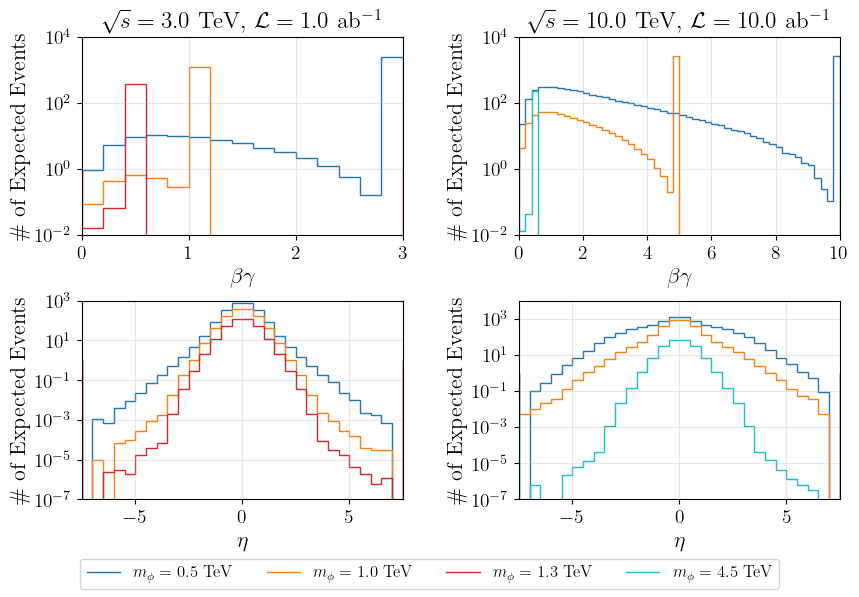

In [38]:
make_histograms_xsec([rts3_runs, rts10_runs], [1e6, 10e6])

## 2D Histogram $\beta \gamma$ vs $\eta$

In [55]:
function fbin(summary, βγ_range, η_range)
    Nevent = length(summary[1,:])
    βγ_test = βγ_range[1] .<= summary[2,:] .< βγ_range[2]
    η_test = η_range[1] .<= summary[3,:] .< η_range[2]
    res = sum(βγ_test .&& η_test)
    return res / Nevent
end

function bin_data_2d(rts_runs, lumi; binsize=[[0.05, 0.05, 0.05], 0.5])
    N_mphis = length(rts_runs.mphis)
    mphi_runs = get_run_with_summary.((rts_runs,), Vector(1:N_mphis))
    N_events = length(mphi_runs[1].mumu_summary[1,:])

    eachmax_βγ = [maximum(mphi_runs[j].mumu_summary[2,:]) for j in 1:N_mphis]
    eachmax2_βγ = [maximum(mphi_runs[j].vv_summary[2,:]) for j in 1:N_mphis]
    βγ_locs = Vector{Vector{Float64}}()

    η_bins = range(-5.5, 5.5; step=binsize[2])
    η_locs = (η_bins[2:end] .+ η_bins[1:end-1])./2

    η_s = [[η_bins[i], η_bins[i+1]] for i in 1:(length(η_bins)-1)]

    res = Vector{Matrix{Float64}}()

    for i in 1:N_mphis
        binmax_βγ = max(eachmax_βγ[i], eachmax2_βγ[i])
        βγ_bins = range(0, ceil(binmax_βγ/binsize[1][i])*binsize[1][i]; 
                    step=binsize[1][i])
        push!(βγ_locs, (βγ_bins[2:end] .+ βγ_bins[1:end-1])./2)

        βγ_s = [[βγ_bins[i], βγ_bins[i+1]] for i in 1:(length(βγ_bins)-1)]

        frac_mumu = fbin.((mphi_runs[i].mumu_summary,), βγ_s, η_s')
        frac_vv = fbin.((mphi_runs[i].vv_summary,), βγ_s, η_s')

        n_mumu = @. mphi_runs[i].mumu_xsec * lumi * frac_mumu
        n_vv = @. mphi_runs[i].vv_xsec * lumi * frac_vv

        push!(res, n_mumu .+ n_vv)
    end
    return (N_events=res, ηs=η_locs, βγs=βγ_locs, rts=rts_runs.rts,
            lumi=lumi, mphis=(1e-3 .* rts_runs.mphis))
end

function make_2d_hist(binned_data)
    title = L"$\sqrt{s} = %$(1e-3*binned_data.rts)$ TeV, $\mathcal{L} = %$(binned_data.lumi*1e-6)$ ab$^{-1}$"
    labels = Vector{String}()

    for m in binned_data.mphis
        push!(labels, L"$m_\phi = %$(round(m,digits=1))$ TeV")
    end

    xlabels = [L"\beta \gamma", L"\eta"]
    colors = ["tab:blue", "tab:orange", "tab:red"]
    linestyles = ["solid", "dashed"]

    fig, axs = subplots(3, 1, figsize=(5, 10))

    min_N = 1e-7
    max_N = 1e3

    Lτ_levels = 10 .^ range(log10(.2), log10(to_cm_ns*maximum(maximum.(binned_data.βγs))), 8)
    formatter(l) = L"%$(round(l, sigdigits=2))"

    for (i, a) in enumerate(axs)
        a.set_xlim(-5.5, 5.5)
        a.set_ylim(0, binned_data.βγs[i][end] + 
            (binned_data.βγs[i][2]-binned_data.βγs[i][1])/2)
            
        g = a.pcolormesh(binned_data.ηs, binned_data.βγs[i], 
            binned_data.N_events[i], norm="log", cmap="inferno",
            vmin=min_N, vmax=max_N)

        βγ_max = binned_data.βγs[i][end] + (binned_data.βγs[i][2]-binned_data.βγs[i][1])/2
        βγ_Lτ = range(0, βγ_max, 50)
        ηs_Lτ = range(-5.5, 5.5, 50)
        Lτs = @. to_cm_ns * βγ_Lτ / cosh(ηs_Lτ')
        C = a.contour(ηs_Lτ, βγ_Lτ, Lτs,
                    levels=Lτ_levels, colors="black")

        txts = clabel(C, Lτ_levels, colors="k", fmt=formatter, 
            use_clabeltext=true, inline=true)#, fontsize=16)
        
        for t in txts
            t.set_path_effects([pe.withStroke(linewidth=3, foreground="w")])
        end

        a.set_xlabel(L"\eta")
        a.set_ylabel(L"\beta \gamma")

        a.set_title(labels[i])

        a.grid(alpha=0.3)

        fig.colorbar(g)
    end

    fig.suptitle(title)

    plotclose()
    return fig
end
;

In [56]:
rts3_binned = bin_data_2d(rts3_runs, 1e6);

In [57]:
rts10_binned = bin_data_2d(rts10_runs, 10e6; binsize=[[0.2, 0.2, 0.05], 0.5]);

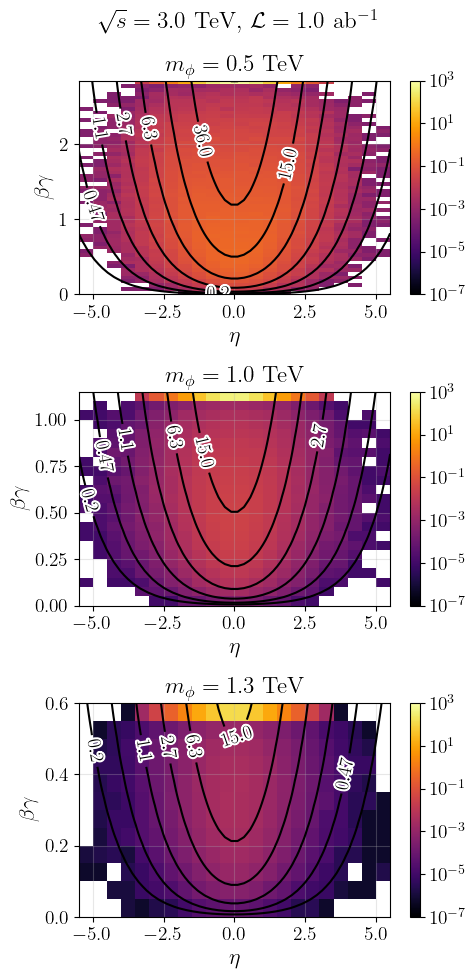

In [58]:
f2d_3 = make_2d_hist(rts3_binned)
# f2d_3.savefig(FIGDIR*"2d_betagamma_eta_rts=3.pdf")
f2d_3

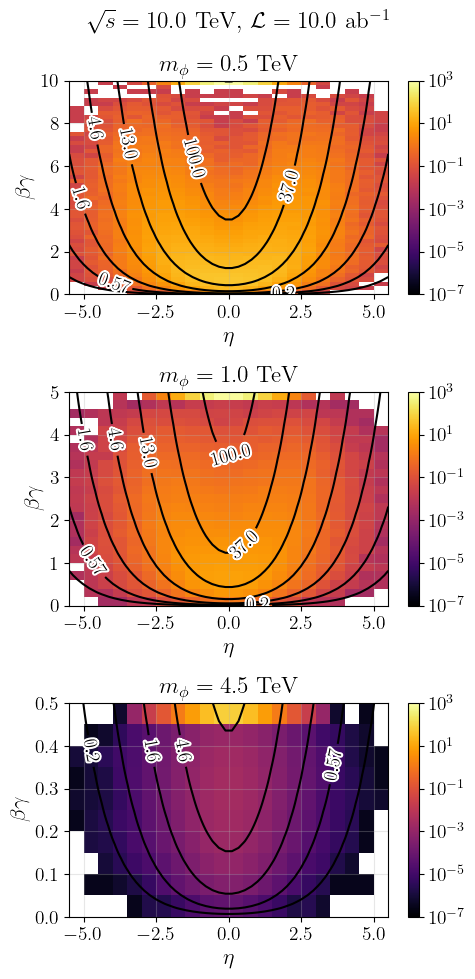

In [59]:
f2d = make_2d_hist(rts10_binned)
# f2d.savefig(FIGDIR*"2d_betagamma_eta_rts=10.pdf", bbox_inches="tight")
f2d

## 2D Histogram $L/\tau_\phi$ vs $\eta$

In [60]:
function fbin_2(summary, Lτ_range, η_range)
    Nevent = length(summary[1,:])
    Lτ = summary[2,:] ./ cosh.(summary[3,:])
    Lτ_test = Lτ_range[1] .<= Lτ .< Lτ_range[2]
    η_test = η_range[1] .<= summary[3,:] .< η_range[2]
    res = sum(Lτ_test .&& η_test)
    return res / Nevent
end

function bin_data_2d_Lτ(rts_runs, lumi; binsize=[[0.05, 0.05, 0.05],.5])
    N_mphis = length(rts_runs.mphis)
    mphi_runs = get_run_with_summary.((rts_runs,), Vector(1:N_mphis))
    N_events = length(mphi_runs[1].mumu_summary[1,:])

    mumu_Lτ = [mphi_runs[j].mumu_summary[2,:] ./ 
                cosh.(mphi_runs[j].mumu_summary[3,:]) for j in 1:N_mphis]
    vv_Lτ = [mphi_runs[j].vv_summary[2,:] ./ 
            cosh.(mphi_runs[j].vv_summary[3,:]) for j in 1:N_mphis]

    eachmax_βγ = [maximum(mphi_runs[j].mumu_summary[2,:]) for j in 1:N_mphis]
    eachmax2_βγ = [maximum(mphi_runs[j].vv_summary[2,:]) for j in 1:N_mphis]
    Lτ_locs = Vector{Vector{Float64}}()

    η_bins = range(-5.5, 5.5; step=binsize[2])
    η_locs = (η_bins[2:end] .+ η_bins[1:end-1])./2
    η_s = [[η_bins[i], η_bins[i+1]] for i in 1:(length(η_bins)-1)]

    res = Vector{Matrix{Float64}}()

    for i in 1:N_mphis
        binmax_βγ = max(eachmax_βγ[i], eachmax2_βγ[i])
        βγ_bins = range(0, ceil(binmax_βγ/binsize[1][i])*binsize[1][i]; 
                    step=binsize[1][i])
        push!(Lτ_locs, (βγ_bins[2:end] .+ βγ_bins[1:end-1])./2)

        Lτ_s = [[βγ_bins[i], βγ_bins[i+1]] for i in 1:(length(βγ_bins)-1)]

        frac_mumu = fbin_2.((mphi_runs[i].mumu_summary,), Lτ_s, η_s')
        frac_vv = fbin_2.((mphi_runs[i].vv_summary,), Lτ_s, η_s')

        n_mumu = @. mphi_runs[i].mumu_xsec * lumi * frac_mumu
        n_vv = @. mphi_runs[i].vv_xsec * lumi * frac_vv

        push!(res, n_mumu .+ n_vv)
    end
    return (N_events=res, ηs=η_locs, Lτs=Lτ_locs, rts=rts_runs.rts,
            lumi=lumi, mphis=(1e-3 .* rts_runs.mphis))
end

function make_2d_hist_Lτ(binned_data)
    title = L"$\sqrt{s} = %$(1e-3*binned_data.rts)$ TeV, $\mathcal{L} = %$(binned_data.lumi*1e-6)$ ab$^{-1}$"
    labels = Vector{String}()

    for m in binned_data.mphis
        push!(labels, L"$m_\phi = %$(round(m,digits=1))$ TeV")
    end

    fig, axs = subplots(3, 1, figsize=(5, 10))

    min_N = 1e-7
    max_N = 1e3

    for (i, a) in enumerate(axs)
        Lτ_scaled = ustrip.(unnatural.(u"cm*ns^-1", binned_data.Lτs[i]))

        g = a.pcolormesh(binned_data.ηs, Lτ_scaled, 
            binned_data.N_events[i][:,:], norm="log", 
            vmin=min_N, vmax=max_N, cmap="inferno")

        a.set_xlabel(L"\eta")
        a.set_ylabel(L"$L/\tau_\phi$ [cm/ns]")

        a.set_xlim(-5.5, 5.5)
        a.set_ylim(0, ceil(maximum(Lτ_scaled)))

        a.set_title(labels[i])

        a.grid(alpha=0.3)

        fig.colorbar(g)
    end

    fig.suptitle(title)

    plotclose()
    return fig
end
;

In [61]:
rts3_binned_Lτ = bin_data_2d_Lτ(rts3_runs, 1e6);
rts10_binned_Lτ = bin_data_2d_Lτ(rts10_runs, 10e6; binsize=[[0.2, 0.2, 0.05], 0.5]);

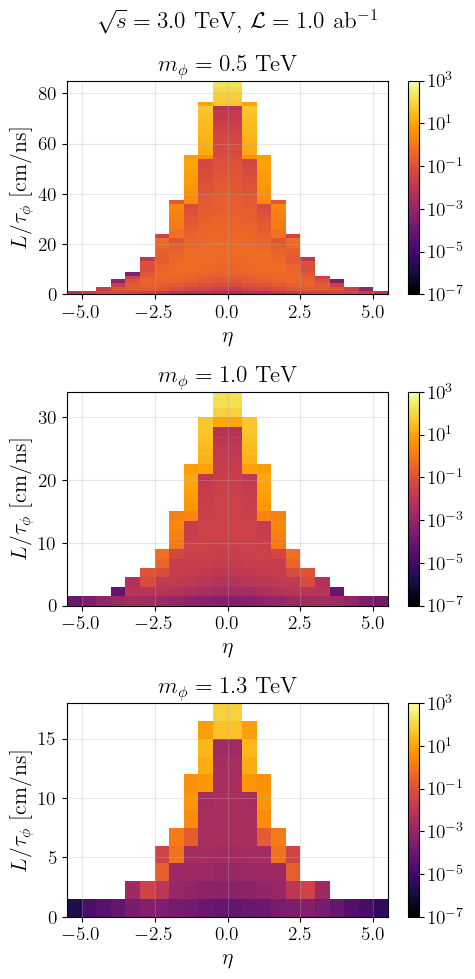

In [62]:
f2d_Lτ_3 = make_2d_hist_Lτ(rts3_binned_Lτ)
# f2d_Lτ_3.savefig(FIGDIR*"Ltau_2d_rts=3.pdf")
f2d_Lτ_3

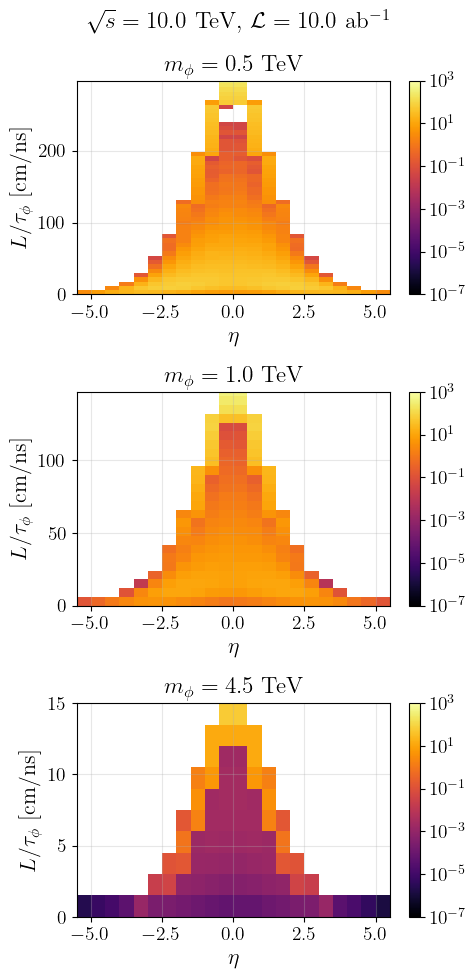

In [63]:
f2d_Lτ_10 = make_2d_hist_Lτ(rts10_binned_Lτ)
# f2d_Lτ_10.savefig(FIGDIR*"Ltau_2d_rts=10.pdf")
f2d_Lτ_10

## 2D Histogram $L/\tau_\phi$ vs $\beta \gamma$

In [68]:
function fbin_3(summary, Lτ_range, βγ_range)
    Nevent = length(summary[1,:])
    Lτ = summary[2,:] ./ cosh.(summary[3,:])
    Lτ_test = Lτ_range[1] .<= Lτ .< Lτ_range[2]
    βγ_test = βγ_range[1] .<= summary[2,:] .< βγ_range[2]
    res = sum(Lτ_test .&& βγ_test)
    return res / Nevent
end

function bin_data_2d_βγ_Lτ(rts_runs, lumi; binsize=[0.05, 0.05, 0.05])
    N_mphis = length(rts_runs.mphis)
    mphi_runs = get_run_with_summary.((rts_runs,), Vector(1:N_mphis))
    N_events = length(mphi_runs[1].mumu_summary[1,:])

    eachmax_βγ = [maximum(mphi_runs[j].mumu_summary[2,:]) for j in 1:N_mphis]
    eachmax2_βγ = [maximum(mphi_runs[j].vv_summary[2,:]) for j in 1:N_mphis]
    βγ_locs = Vector{Vector{Float64}}()

    res = Vector{Matrix{Float64}}()

    for i in 1:N_mphis
        binmax_βγ = max(eachmax_βγ[i], eachmax2_βγ[i])
        βγ_bins = range(0, ceil(binmax_βγ/binsize[i])*binsize[i]; 
                    step=binsize[i])
        push!(βγ_locs, (βγ_bins[2:end] .+ βγ_bins[1:end-1])./2)

        βγ_s = [[βγ_bins[i], βγ_bins[i+1]] for i in 1:(length(βγ_bins)-1)]

        frac_mumu = fbin_3.((mphi_runs[i].mumu_summary,), βγ_s, βγ_s')
        frac_vv = fbin_3.((mphi_runs[i].vv_summary,), βγ_s, βγ_s')

        n_mumu = @. mphi_runs[i].mumu_xsec * lumi * frac_mumu
        n_vv = @. mphi_runs[i].vv_xsec * lumi * frac_vv

        push!(res, n_mumu .+ n_vv)
    end
    return (N_events=res, βγs=βγ_locs, Lτs=βγ_locs, rts=rts_runs.rts,
            lumi=lumi, mphis=(1e-3 .* rts_runs.mphis))
end

function make_2d_hist_βγ_Lτ(binned_data)
    title = L"$\sqrt{s} = %$(1e-3*binned_data.rts)$ TeV, $\mathcal{L} = %$(binned_data.lumi*1e-6)$ ab$^{-1}$"
    labels = Vector{String}()

    for m in binned_data.mphis
        push!(labels, L"$m_\phi = %$(round(m,digits=1))$ TeV")
    end

    fig, axs = subplots(3, 1, figsize=(5, 10))

    min_N = 1e-7
    max_N = 1e3

    for (i, a) in enumerate(axs)
        Lτ_scaled = ustrip.(unnatural.(u"cm*ns^-1", binned_data.Lτs[i]))

        g = a.pcolormesh(binned_data.βγs[i], Lτ_scaled, 
            binned_data.N_events[i][:,:], norm="log", 
            vmin=min_N, vmax=max_N, cmap="inferno")

        a.set_xlabel(L"\beta \gamma")
        a.set_ylabel(L"$L/\tau_\phi$ [cm/ns]")

        # a.set_ylim(0, ceil(maximum(Lτ_scaled)))

        a.set_title(labels[i])

        a.grid(alpha=0.3)

        fig.colorbar(g)
    end

    fig.suptitle(title)

    plotclose()
    return fig
end
;

In [69]:
rts3_binned_βγ_Lτ = bin_data_2d_βγ_Lτ(rts3_runs, 1e6);
rts10_binned_βγ_Lτ = bin_data_2d_βγ_Lτ(rts10_runs, 10e6; binsize=[0.2,0.2,0.05]);

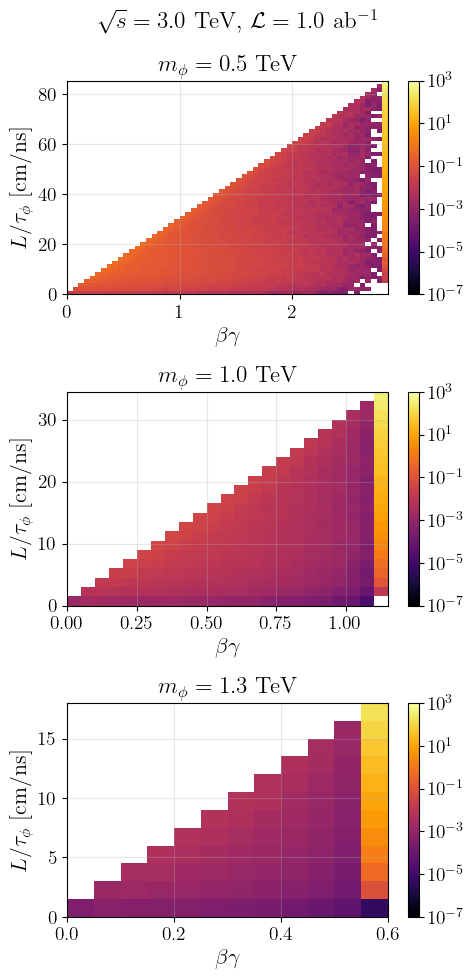

In [70]:
f2d_Lτ_βγ_3 = make_2d_hist_βγ_Lτ(rts3_binned_βγ_Lτ)
# f2d_Lτ_βγ_3.savefig(FIGDIR*"Ltau_vs_betagamma_rts=3.pdf")
f2d_Lτ_βγ_3

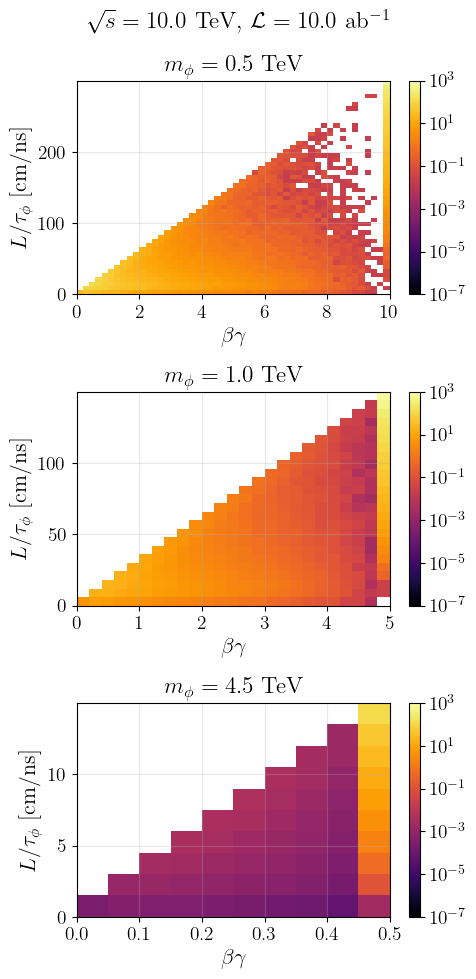

In [71]:
f2d_Lτ_βγ_10 = make_2d_hist_βγ_Lτ(rts10_binned_βγ_Lτ)
# f2d_Lτ_βγ_10.savefig(FIGDIR*"Ltau_vs_betagamma_rts=10.pdf")
f2d_Lτ_βγ_10

# # of expected events decaying in each detector subsystem

In [6]:
rts3_runs = get_runs_at_rts(3, DIR_mumu_scan, DIR_VV_scan)
rts10_runs = get_runs_at_rts(10, DIR_mumu_scan, DIR_VV_scan)
;

In [7]:
function mχ_upper_bound(mφ)
    min(LFDM_Boltz.Mstar_s(mφ/25)/LFDM_Boltz.find_yφf(mφ), mφ)
end

mφ_for_bounds = 10 .^ range(log10(100), 
                                log10(10000/2), 1000)
mχ_upper = mχ_upper_bound.(mφ_for_bounds)
;

In [8]:
import DelimitedFiles: readdlm

seR_dir = "../data/selectron_bounds/"

se_lo_data = readdlm(seR_dir * "seR_bounds_lower.csv", ',')
se_hi_data = readdlm(seR_dir * "seR_bounds_upper.csv", ',')

se_lo_func = linear_interpolation(se_lo_data[:,1], se_lo_data[:,2] .* 1e-9, extrapolation_bc=Line())
se_hi_func = linear_interpolation(se_hi_data[:,1], se_hi_data[:,2] .* 1e-9, extrapolation_bc=Line())

seR_mphis = 10 .^ range(2, log10(584), 100)

seR_lo_mχ = LFDM_Boltz.mχ_life.(se_lo_func.(seR_mphis), seR_mphis)
seR_hi_mχ = LFDM_Boltz.mχ_life.(se_hi_func.(seR_mphis), seR_mphis)
;

In [9]:
function events_in_detector_1(summary, xsec, lumi, mphi, tauphi, R_cm, Z_cm)

    L = (summary[2,:] ./ cosh.(summary[3,:]))*tauphi*to_cm_ns
    Lz = (summary[2,:] .* tanh.(abs.(summary[3,:]))) * tauphi * to_cm_ns
    
    return count((R_cm[1] .< L .< R_cm[2]) .&& (Lz .< Z_cm))*xsec*lumi/length(summary[1,:])
end

function events_in_detector_1η(summary, xsec, lumi, mphi, tauphi, R_cm, η)

    L = (summary[2,:] ./ cosh.(summary[3,:]))*tauphi*to_cm_ns
    
    return count((R_cm[1] .< L .< R_cm[2]) .&& (abs.(summary[3,:]) .< η))*xsec*lumi/length(summary[1,:])
end

function events_in_detector(rts_runs, lumi, τφs, R_cm, Z_cm)
    N_events = 200000
    N_mphi = length(rts_runs.mphis)
    N_mchi = length(τφs[1,:])

    res = zeros(Float64, (N_mphi, N_mchi))

    for i in 1:N_mphi
        run = get_run_with_summary(rts_runs, i)
        for j in 1:N_mchi
            if mchis[j] >= rts_runs.mphis[i]
                res[i,j] = NaN
            else
                N_exp_mumu = events_in_detector_1(run.mumu_summary,
                            run.mumu_xsec, lumi, rts_runs.mphis[i],
                            τφs[i,j], R_cm, Z_cm)
                N_exp_vv = events_in_detector_1(run.vv_summary,
                            run.vv_xsec, lumi, rts_runs.mphis[i],
                            τφs[i,j], R_cm, Z_cm)

                res[i,j] = N_exp_vv .+ N_exp_mumu
            end
        end
    end
    return res
end

function events_in_detector_η(rts_runs, lumi, τφs, R_cm, η)
    N_events = 200000
    N_mphi = length(rts_runs.mphis)
    N_mchi = length(τφs[1,:])

    res = zeros(Float64, (N_mphi, N_mchi))

    for i in 1:N_mphi
        run = get_run_with_summary(rts_runs, i)
        for j in 1:N_mchi
            if mchis[j] >= rts_runs.mphis[i]
                res[i,j] = NaN
            else
                N_exp_mumu = events_in_detector_1η(run.mumu_summary,
                            run.mumu_xsec, lumi, rts_runs.mphis[i],
                            τφs[i,j], R_cm, η)
                N_exp_vv = events_in_detector_1η(run.vv_summary,
                            run.vv_xsec, lumi, rts_runs.mphis[i],
                            τφs[i,j], R_cm, η)

                res[i,j] = N_exp_vv .+ N_exp_mumu
            end
        end
    end
    return res
end

function events_in_detector(rts_runs, lumi, mchis)
    detector_Rs = [[3, 10.4], [12.7, 55.4], [81.9, 148.6], [150, 170.2], 
                    [174, 333], [348.3, 429.0], [446.1, 645.0], [645.0, Inf]]
    detector_Zs = [65, (69.2+48.2)/2, 124.9, 221.0, 221.0, 412.9, 417.9, Inf]

    det_labs = ["in Vertex Detector", "in Inner Tracker", "in Outer Tracker", "in ECAL",
                "in HCAL", "in Solenoid", "in Muon Detector", "Outside"]

    N_exp = zeros(Float64, (length(detector_Rs), length(rts_runs.mphis), 
                    length(mchis)))
    
    τφs = lifetimes(rts_runs.mphis, mchis).*1e9
    
    for i in 1:(length(detector_Rs)-1)
        N_exp[i,:,:] = events_in_detector(rts_runs, lumi, τφs, detector_Rs[i],
            detector_Zs[i])
    end

    N_exp[end,:,:] = events_in_detector_η(rts_runs, lumi, τφs, 
                        detector_Rs[end], 0.61)

    return (N_exp=N_exp, rts=rts_runs.rts, lumi=lumi, mphis=rts_runs.mphis,
            mchis=mchis, labels=det_labs)
end
;

In [17]:
function make_money(events_in_detector)
    eid = events_in_detector
    title = L"Number of Expected Events ($\sqrt{s} = %$(1e-3*eid.rts)$ TeV, $\mathcal{L} = %$(eid.lumi*1e-6)$ ab$^{-1}$)"

    fig, axs = subplots(4,2,figsize=(10,12))

    mphi_plot = 10 .^ range(log10(eid.mphis[1]), log10(eid.mphis[end]), 100)
    mchi_plot = 10 .^ range(log10(eid.mchis[1]), log10(eid.mchis[end]), 100)

    cmap = mpl.cm.Purples
    bounds = -5.0:2.0:5.0
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend="both")
    
    idx = 1
    for ax in axs
        for a in ax
            q = eid.N_exp[idx,:,:]

            g = a.pcolormesh(eid.mchis, eid.mphis, log10.(q), norm=norm,
                            cmap=cmap)
            a.fill_betweenx(mφ_for_bounds, mχ_upper, 1e4, color="gainsboro", 
                            zorder=2)

            a.fill_between(eid.mchis, 0, 490, edgecolor="tab:blue", facecolor="none")
            
            a.fill_betweenx(seR_mphis, seR_lo_mχ, seR_hi_mχ, edgecolor="tab:orange",
                            facecolor="none")
            
            formatter(l) = L"10^{ %$(Int(l)) }"

            a.set_xscale("log")
            a.set_yscale("log")
            a.set_xlim(eid.mchis[1], eid.mchis[end])
            a.set_ylim(1e2, eid.rts/2)
            cbar = fig.colorbar(g)
            cbar.ax.set_yticklabels(formatter.(bounds))
            a.set_title("Decays $(eid.labels[idx])")
            a.set_xlabel(L"$m_\chi$ [GeV]")
            a.set_ylabel(L"$m_\phi$ [GeV]")

            idx += 1
        end
    end

    fig.suptitle(title)

    plotclose()

    return fig
end

function make_money_max(events_in_detector)
    eid = events_in_detector

    cmap = mpl.cm.Purples
    bounds = -5.0:2.0:5.0
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend="both")

    fig = figure(figsize=(8,5))

    q = maximum(eid.N_exp, dims=1)[1,:,:]

    g = pcolormesh(eid.mchis, eid.mphis, log10.(q), norm=norm, cmap=cmap)
    fill_betweenx(mφ_for_bounds, mχ_upper, 5e3, color="gainsboro", zorder=2)

    fill_between(eid.mchis, 0, 490, edgecolor="yellow", facecolor="none")
            
    fill_betweenx(seR_mphis, seR_lo_mχ, seR_hi_mχ, edgecolor="tab:orange",
                    facecolor="none")
                    
    xscale("log")
    yscale("log")
    xlim(eid.mchis[1], eid.mchis[end])
    ylim(1e2, eid.rts/2)

    formatter(l) = L"10^{ %$(Int(l)) }"
    cbar = colorbar(g)
    cbar.ax.set_yticklabels(formatter.(bounds))

    title(L"$\sqrt{s} = %$(1e-3*eid.rts)$ TeV, $\mathcal{L} = %$(eid.lumi*1e-6)$ ab$^{-1}$")
    xlabel(L"$m_\chi$ [GeV]")
    ylabel(L"$m_\phi$ [GeV]")

    plotclose()

    return fig
end
;

In [13]:
mchis = 10 .^ range(-5, log10(3.5e3), 50);

In [7]:
eid3 = events_in_detector(rts3_runs, 1e6, mchis);

In [14]:
eid10 = events_in_detector(rts10_runs, 10e6, mchis);

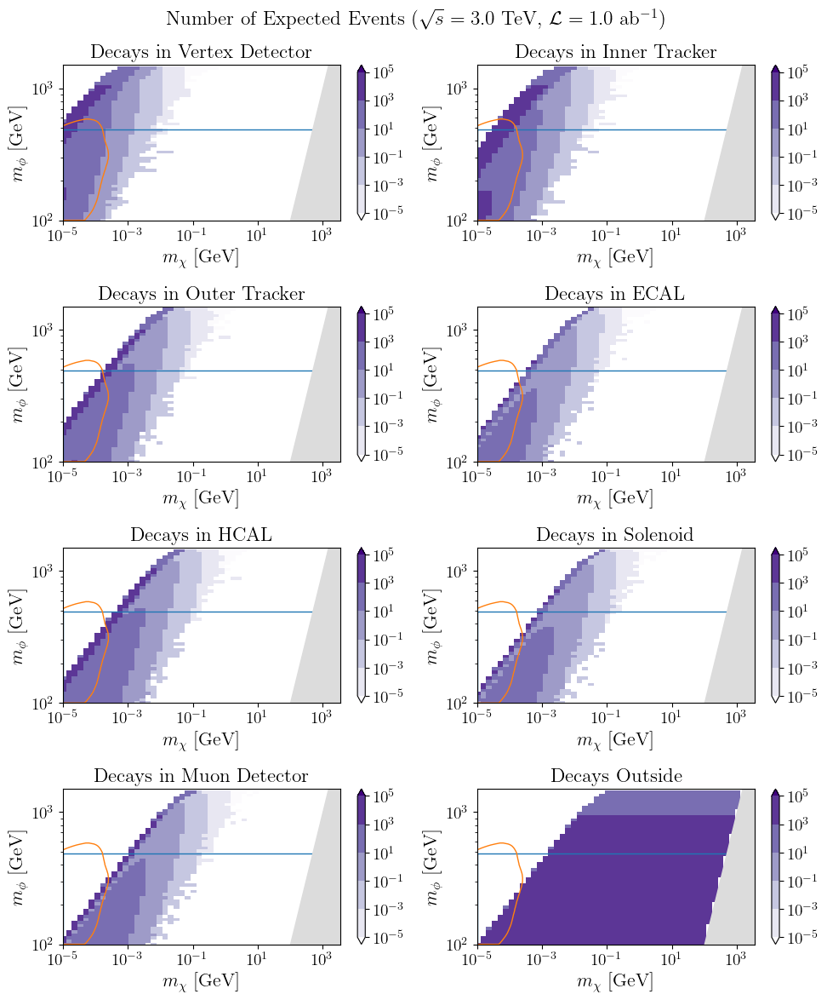

In [14]:
f_money = make_money(eid3)
# f_money.savefig(FIGDIR*"decays_mphi_mchi_rts=3.pdf", bbox_inches="tight")
f_money

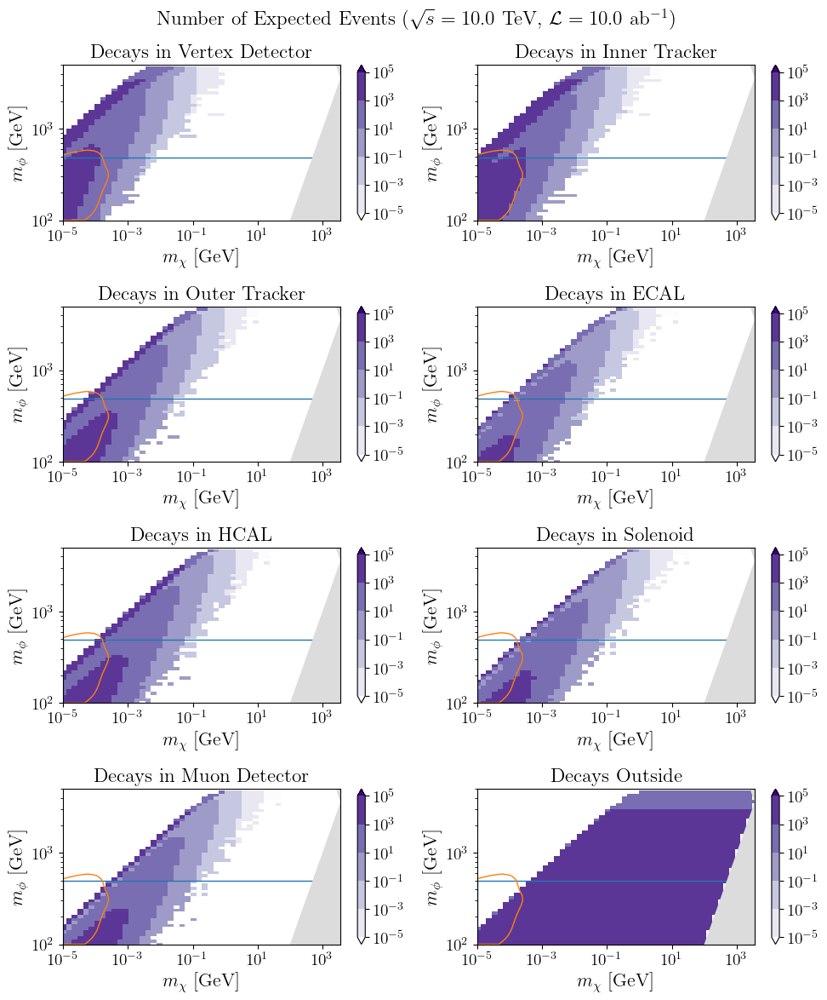

In [15]:
f_money10 = make_money(eid10)
# f_money10.savefig(FIGDIR*"decays_mphi_mchi_rts=10.pdf", bbox_inches="tight")
f_money10

In [ ]:
f_mm = make_money_max(eid3)
# f_mm.savefig(FIGDIR*"decays_max_rts=3.pdf")
f_mm

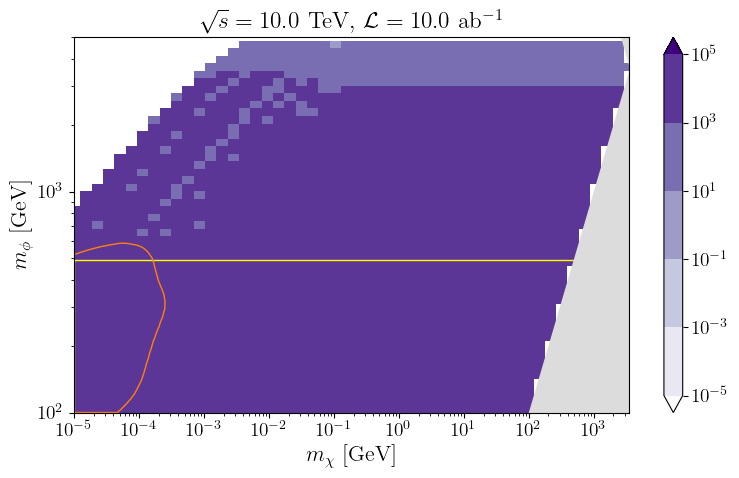

In [18]:
f_mm = make_money_max(eid10)
# f_mm.savefig(FIGDIR*"decays_max_rts=10.pdf")
f_mm